In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import statistics

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)


In [2]:
covid_df = pd.read_csv('total-and-daily-cases-covid-19.csv')

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
covid_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
0,Afghanistan,AFG,"Dec 31, 2019",0,0
1,Afghanistan,AFG,"Jan 1, 2020",0,0
2,Afghanistan,AFG,"Jan 2, 2020",0,0
3,Afghanistan,AFG,"Jan 3, 2020",0,0
4,Afghanistan,AFG,"Jan 4, 2020",0,0
5,Afghanistan,AFG,"Jan 5, 2020",0,0
6,Afghanistan,AFG,"Jan 6, 2020",0,0
7,Afghanistan,AFG,"Jan 7, 2020",0,0
8,Afghanistan,AFG,"Jan 8, 2020",0,0
9,Afghanistan,AFG,"Jan 9, 2020",0,0


In [5]:
india_df = covid_df.loc[covid_df['Entity'] == 'India']

In [6]:
india_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
9312,India,IND,"Dec 31, 2019",0,0
9313,India,IND,"Jan 1, 2020",0,0
9314,India,IND,"Jan 2, 2020",0,0
9315,India,IND,"Jan 3, 2020",0,0
9316,India,IND,"Jan 4, 2020",0,0
9317,India,IND,"Jan 5, 2020",0,0
9318,India,IND,"Jan 6, 2020",0,0
9319,India,IND,"Jan 7, 2020",0,0
9320,India,IND,"Jan 8, 2020",0,0
9321,India,IND,"Jan 9, 2020",0,0


In [7]:
india_df.iloc[:,2]

9312    Dec 31, 2019
9313     Jan 1, 2020
9314     Jan 2, 2020
9315     Jan 3, 2020
9316     Jan 4, 2020
9317     Jan 5, 2020
9318     Jan 6, 2020
9319     Jan 7, 2020
9320     Jan 8, 2020
9321     Jan 9, 2020
9322    Jan 10, 2020
9323    Jan 11, 2020
9324    Jan 12, 2020
9325    Jan 13, 2020
9326    Jan 14, 2020
9327    Jan 15, 2020
9328    Jan 16, 2020
9329    Jan 17, 2020
9330    Jan 18, 2020
9331    Jan 19, 2020
9332    Jan 20, 2020
9333    Jan 21, 2020
9334    Jan 22, 2020
9335    Jan 23, 2020
9336    Jan 24, 2020
9337    Jan 25, 2020
9338    Jan 26, 2020
9339    Jan 27, 2020
9340    Jan 28, 2020
9341    Jan 29, 2020
9342    Jan 30, 2020
9343    Jan 31, 2020
9344     Feb 1, 2020
9345     Feb 2, 2020
9346     Feb 3, 2020
9347     Feb 4, 2020
9348     Feb 5, 2020
9349     Feb 6, 2020
9350     Feb 7, 2020
9351     Feb 8, 2020
9352     Feb 9, 2020
9353    Feb 10, 2020
9354    Feb 11, 2020
9355    Feb 12, 2020
9356    Feb 13, 2020
9357    Feb 14, 2020
9358    Feb 15, 2020
9359    Feb 1

In [85]:
daily_cases = india_df[['Date']].copy()
daily_cases['ds'] =  pd.to_datetime(india_df.iloc[:,2])
daily_cases = daily_cases.drop(columns='Date')
daily_cases['y'] = india_df['Daily new confirmed cases (cases)']
daily_cases

,ds,y
9312,2019-12-31,0
9313,2020-01-01,0
9314,2020-01-02,0
9315,2020-01-03,0
9316,2020-01-04,0
9317,2020-01-05,0
9318,2020-01-06,0
9319,2020-01-07,0
9320,2020-01-08,0
9321,2020-01-09,0


In [63]:
daily_cases.tail()

,ds,y
9457,2020-05-25,6977
9458,2020-05-26,6535
9459,2020-05-27,6387
9460,2020-05-28,6566
9461,2020-05-29,7466


In [64]:
#daily_cases.index = pd.to_datetime(daily_cases.Date)
#daily_cases = daily_cases.drop(columns = 'Date')

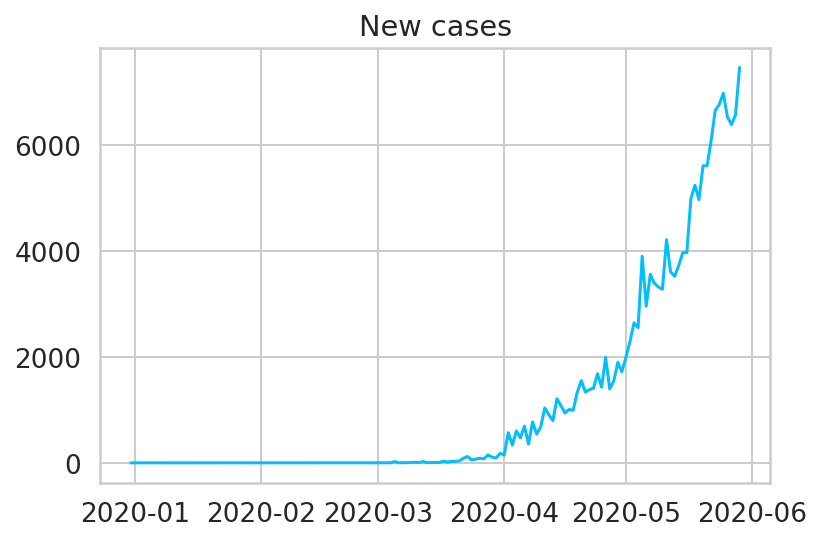

In [65]:
plt.plot(daily_cases['ds'],daily_cases['y'])
plt.title("New cases");

In [66]:
total_cases = india_df[['Date']].copy()
total_cases['ds'] =  pd.to_datetime(india_df.iloc[:,2])
total_cases = total_cases.drop(columns='Date')
total_cases['y'] = india_df['Total confirmed cases (cases)']
total_cases

,ds,y
9312,2019-12-31,0
9313,2020-01-01,0
9314,2020-01-02,0
9315,2020-01-03,0
9316,2020-01-04,0
9317,2020-01-05,0
9318,2020-01-06,0
9319,2020-01-07,0
9320,2020-01-08,0
9321,2020-01-09,0


In [67]:
total_cases.tail()

,ds,y
9457,2020-05-25,138845
9458,2020-05-26,145380
9459,2020-05-27,151767
9460,2020-05-28,158333
9461,2020-05-29,165799


ds    False
y     False
dtype: bool

In [68]:
# total_cases.index = pd.to_datetime(total_cases.Date)
# total_cases = total_cases.drop(columns = 'Date')
# total_cases

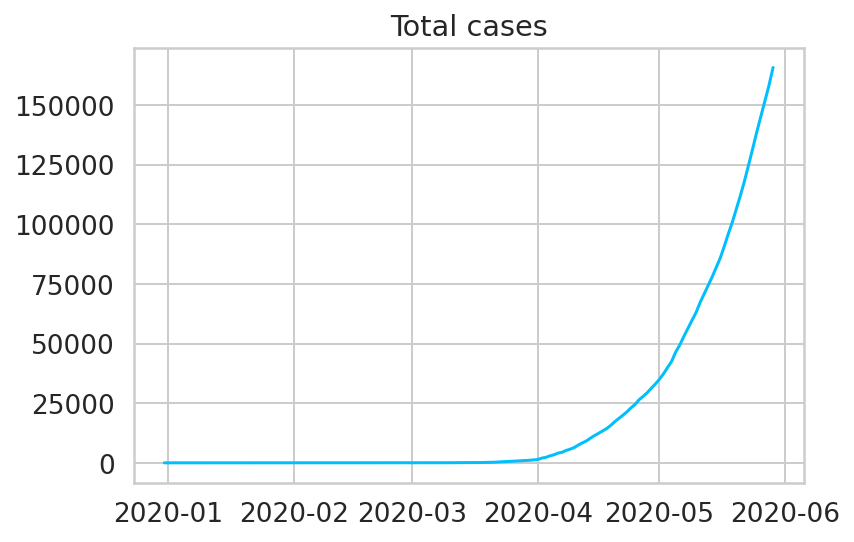

In [71]:
plt.plot(total_cases['ds'],total_cases['y'])
plt.title("Total cases");

In [72]:
df = daily_cases[['y']].copy()

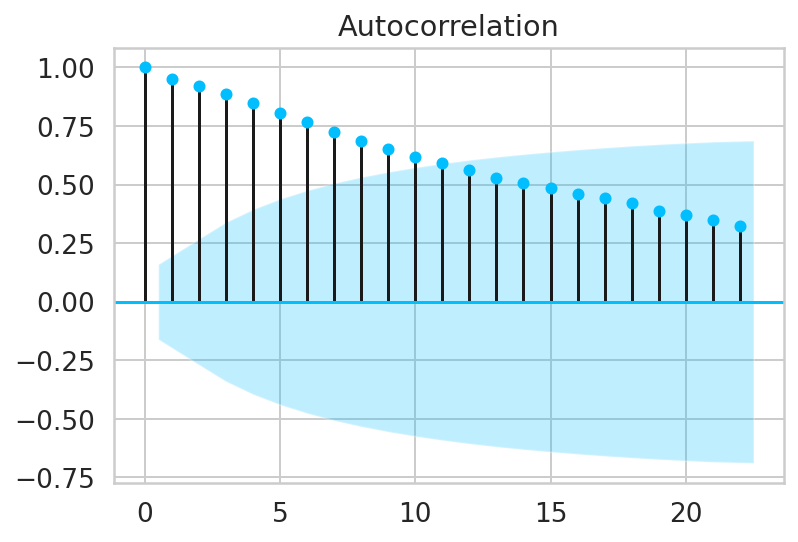

In [73]:
plot_acf(df)
plt.show()
# determining Moving average terms =10 or 5

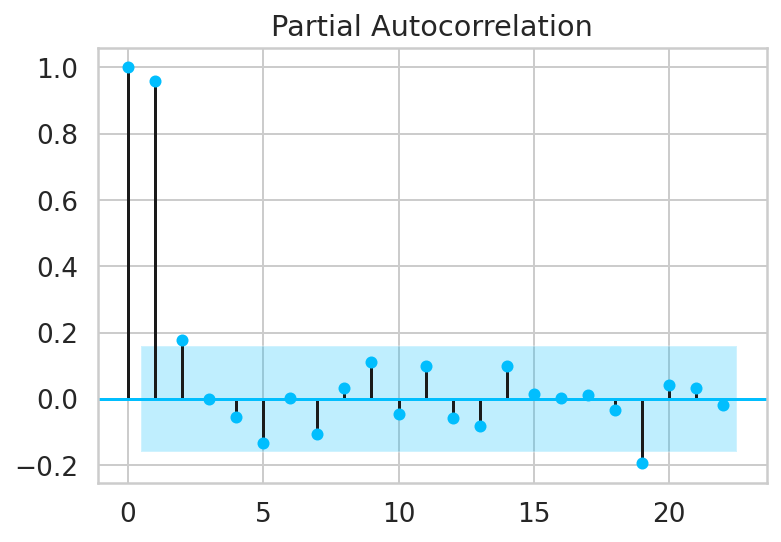

In [74]:
plot_pacf(df)
plt.show()
# determinig AR terms = 1

In [ ]:
daily_cases = daily_cases.set_index('ds').asfreq('d')

In [94]:
daily_cases=daily_cases.fillna(5.0)

In [95]:
daily_cases = daily_cases.astype(int)
daily_cases

,y
ds,
2019-12-31,0
2020-01-01,0
2020-01-02,0
2020-01-03,0
2020-01-04,0
2020-01-05,0
2020-01-06,0
2020-01-07,0
2020-01-08,0


In [97]:
# AR =5 Differences = 2 MA = 1 transparameters = False because data is not stationary
ARMAmodel = ARIMA(daily_cases, order=(5,1,1)).fit(transparams=False)

/home/vineet/.local/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [98]:
print(ARMAmodel.summary())

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  150
Model:                 ARIMA(5, 1, 1)   Log Likelihood               -1026.469
Method:                       css-mle   S.D. of innovations                nan
Date:                Mon, 01 Jun 2020   AIC                           2068.939
Time:                        17:39:01   BIC                           2093.024
Sample:                    01-01-2020   HQIC                          2078.724
                         - 05-29-2020                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         50.7733     16.381      3.099      0.002      18.667      82.880
ar.L1.D.y     -0.6604      0.156     -4.244      0.000      -0.965      -0.355
ar.L2.D.y      0.0077      0.117      0.066      0.9

In [101]:
ARMA1predict = ARMAmodel.predict(start='2020/05/30',end = '2020/06/12', typ='levels')

In [102]:
print('Forecast/preditions for 5 hours ahead ', ARMA1predict)

Forecast/preditions for 5 hours ahead  2020-05-30    7119.312134
2020-05-31    7544.164905
2020-06-01    7610.067311
2020-06-02    7640.645570
2020-06-03    7573.828068
2020-06-04    7834.567354
2020-06-05    7667.345199
2020-06-06    7829.160883
2020-06-07    7845.259285
2020-06-08    7917.262444
2020-06-09    7910.346611
2020-06-10    8049.254774
2020-06-11    8019.693426
2020-06-12    8119.788248
Freq: D, dtype: float64


In [105]:
ARMA1predict = pd.DataFrame(ARMA1predict,columns=['NewCases'])

In [106]:
ARMA1predict

,NewCases
2020-05-30,7119.312134
2020-05-31,7544.164905
2020-06-01,7610.067311
2020-06-02,7640.645570
2020-06-03,7573.828068
2020-06-04,7834.567354
2020-06-05,7667.345199
2020-06-06,7829.160883
2020-06-07,7845.259285
2020-06-08,7917.262444


In [107]:
Total = []
temp =165799
for val in ARMA1predict['NewCases']:
    temp = temp+val
    Total.append(temp)
ARMA1predict['TotalCases'] = Total
ARMA1predict

,NewCases,TotalCases
2020-05-30,7119.312134,172918.312134
2020-05-31,7544.164905,180462.477039
2020-06-01,7610.067311,188072.544350
2020-06-02,7640.645570,195713.189919
2020-06-03,7573.828068,203287.017987
2020-06-04,7834.567354,211121.585341
2020-06-05,7667.345199,218788.930540
2020-06-06,7829.160883,226618.091423
2020-06-07,7845.259285,234463.350707
2020-06-08,7917.262444,242380.613151


In [118]:
total_cases = total_cases.set_index('ds').asfreq('d')

(array([737425., 737456., 737485., 737516., 737546., 737577.]),
 <a list of 6 Text major ticklabel objects>)

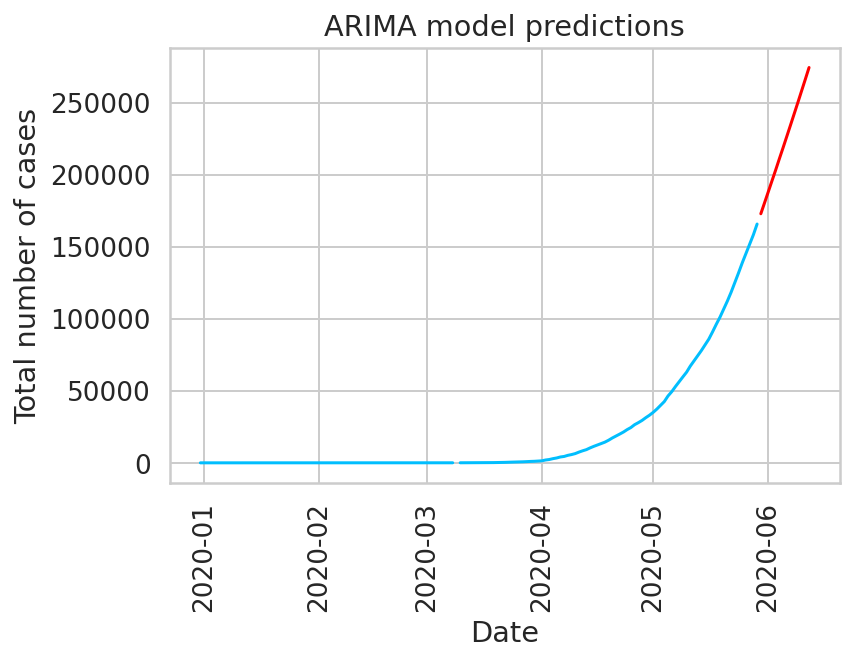

In [121]:
plt.plot(total_cases)
plt.plot(ARMA1predict['TotalCases'],color = 'red')
plt.xlabel('Date')
plt.ylabel('Total number of cases')
plt.title('ARIMA model predictions')
plt.xticks(rotation=90)